# Symmetry of language networks

## languages

In [1]:
import pandas as pd

In [2]:
## classification by macroarea :)
## https://glottolog.org/meta/downloads

macroarea = pd.read_csv('languages_and_dialects_geo.csv',sep=',')

In [3]:
macroarea.dropna(inplace = True)

In [4]:
macroarea = macroarea[['isocodes','macroarea']]

In [5]:
## dictionary iso_code:macroarea

macroarea = dict(zip(macroarea['isocodes'], macroarea['macroarea']))

In [6]:
## filter by languages of the americas

macroarea = {language:macroarea[language] for language in macroarea.keys()}# if macroarea[language] in ['South America','North America']}

In [7]:
## corpus UDHR https://www.unicode.org/udhr/index.html

languages={}

for language in macroarea.keys():
    try: 
        file = open('udhr/'+'udhr_'+language+'.txt', 'r', encoding='utf-8')  
        language_text=file.read().split('\n')
        languages[language]=[line.strip() for line in language_text]
        languages[language]=[line for line in languages[language] if len(line)>0]
    except FileNotFoundError:
        pass

In [8]:
len(languages)

362

In [9]:
## mapudungun :)

languages['zro'][:10]

['Universal Declaration of Human Rights - Záparo',
 '© 1996 – 2009 The Office of the High Commissioner for Human Rights',
 'This plain text version prepared by the “UDHR in Unicode”',
 'project, https://www.unicode.org/udhr.',
 '---',
 '?',
 'KAWIRIAJA KAYAPI RIKUANU 50 APARUA AKASUJUNUKA KUNUMASHIRA KINIANA KAYAPUINA 1948-1998 KUNUMASHIRA KIRAKA RIKUANU KAYAPI',
 'Kiraitia kiniana amimaja jinia, kiniana kiraka niata nuka 10 tuwijia kashikua jiania aparua 1948 aitika aniti atijianuka kunumashira kiraka rikuanu. Kayapuina ta nuka ikicha arishnu nukicha tia nukaka kiniana panichanu akasujunuka ikicha wikaishinu inianu aitika itiama iya tamanu aitikua aiti taikua ikima kiraitia niatajinia rapaka jinia tamanu akasujunuka.',
 'Witsa ikicha panichanu niakawiria jinia kutarajita kawiriaja ku aramaja ikicha kupani majicha.',
 'Panichanu tamasa taykua kayapi kupanimajicha ikicha nuka kiniana amimaja anakijaunuka taikua inianu. Witsaka akasujunuka iya yakawi witsaja ikicha niakawiria nukaka kuak

In [10]:
languoid = pd.read_csv('languoid.csv',sep=',')

In [11]:
languoid

,id,family_id,parent_id,name,bookkeeping,level,latitude,longitude,iso639P3code,description,markup_description,child_family_count,child_language_count,child_dialect_count,country_ids
0,3adt1234,afro1255,nort3292,3Ad-Tekles,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
1,aala1237,aust1307,ramo1244,Aalawa,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
2,aant1238,nucl1709,nort2920,Aantantara,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
3,aari1238,sout2845,ahkk1235,Aari-Gayil,False,family,NaN,NaN,aiz,NaN,NaN,0,2,0,NaN
4,aari1239,sout2845,aari1238,Aari,False,language,5.95034,36.5721,aiw,NaN,NaN,0,0,0,ET
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25434,zuti1239,tupi1275,guaj1255,Guajajára of Zutiua,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25435,zuwa1238,koia1260,omie1241,Zuwadza,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25436,zwal1238,atla1278,shal1242,Zwall,False,dialect,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN
25437,zyph1238,sino1245,nucl1757,Zyphe,False,language,22.52400,93.2640,zyp,NaN,NaN,0,0,2,IN MM


In [12]:
location = languoid[['iso639P3code','latitude','longitude']]
location = location.dropna()

In [13]:
location_lat = dict(zip(location['iso639P3code'],location['latitude']))
location_lon = dict(zip(location['iso639P3code'],location['longitude']))

In [14]:
location = {key:[location_lat[key],location_lon[key]] for key in location_lat.keys() if key in languages}

In [15]:
len(location)

362

In [16]:
languoid = languoid[['family_id','iso639P3code']]

In [17]:
languoid.dropna(inplace = True)

<ipython-input-17-1b6434c9b68b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  languoid.dropna(inplace = True)


In [18]:
len(languoid)

7867

In [19]:
languoid = dict(zip(languoid['iso639P3code'],languoid['family_id']))

In [20]:
fam_dict = {}

for key in languages.keys():
    if key in languoid.keys():
        fam_dict[key] = languoid[key] 
    else:
        fam_dict[key] = 'unk'

In [21]:
len(fam_dict)

362

In [22]:
from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(fam_dict.items()):
    v[value].append(key)

family = dict(v)

In [23]:
family_num = {key:len(family[key]) for key in family.keys()}

In [24]:
len(family_num)

55

In [25]:
sum(family_num.values())-(83+72+33+16+13+10+10)

125

In [26]:
{k: v for k, v in sorted(family_num.items(), key=lambda item: item[1],reverse=True)}

{'indo1319': 83,
 'atla1278': 72,
 'aust1307': 33,
 'sino1245': 16,
 'quec1387': 13,
 'afro1255': 10,
 'turk1311': 10,
 'araw1281': 8,
 'mand1469': 8,
 'maya1287': 8,
 'otom1299': 8,
 'ural1272': 8,
 'pano1259': 7,
 'unk': 5,
 'nilo1247': 5,
 'tung1282': 5,
 'taik1256': 4,
 'drav1251': 4,
 'aust1305': 4,
 'abkh1242': 3,
 'jiva1245': 3,
 'barb1265': 3,
 'algi1248': 3,
 'zapa1251': 2,
 'arti1236': 2,
 'tupi1275': 2,
 'hmon1336': 2,
 'eski1264': 2,
 'utoa1244': 2,
 'tuca1253': 2,
 'hara1260': 1,
 'arau1255': 1,
 'ayma1253': 1,
 'bora1262': 1,
 'book1242': 1,
 'cahu1265': 1,
 'musk1252': 1,
 'song1307': 1,
 'yano1268': 1,
 'huit1251': 1,
 'japo1237': 1,
 'kart1248': 1,
 'mong1349': 1,
 'saha1256': 1,
 'kore1284': 1,
 'misu1242': 1,
 'mixe1284': 1,
 'atha1245': 1,
 'pama1250': 1,
 'ticu1244': 1,
 'guai1249': 1,
 'toto1251': 1,
 'tara1323': 1,
 'peba1241': 1,
 'yuka1259': 1}

## basic statistics: types and tokens

In [27]:
def tokenize(s):
    return s.split(' ')

In [28]:
def clean(L):
    language=languages[L]
    table = str.maketrans({key: None for key in '``!"#$%&\¿()*+,-./:;<=>?@[\\]_{|}'})
    language=[list(filter(None, [w.lower().translate(table) for w in tokenize(sentence)])) for sentence in language if len([w.lower() for w in [w.translate(table) for w in tokenize(sentence)]])>0]
    language=[[w for w in s if w!="''"] for s in language] 
    language=[[w for w in s if w!='̃'] for s in language] 
    language=[[w for w in s if not w.isdigit()] for s in language]
    return language[9:]

In [29]:
clean_languages={}
for language in languages:
    C=clean(language)
    if len(C)>0:
        clean_languages[language]=clean(language)

In [30]:
len(clean_languages['kwi'])

198

In [31]:
for language in clean_languages.keys():
    print(language, clean_languages[language][0])

abk ['иара', 'убас', 'ауаҩы', 'аџьамыҕәеи', 'ахәуреи', 'иаартны', 'дырҿамгылар', 'ада', 'царҭа', 'имамкәа', 'аҟынӡа', 'инамгараз', 'ауаҩы', 'изинқәа', 'азакуан', 'амчра', 'иамыхьчар', 'ада', 'ҧсыхәа', 'шыҟам', 'хшыҩзышьҭра', 'азуа']
ace ['teuseubot', 'bak', 'phon', '“martabat', 'alamiah”', 'hak', 'nyang', 'pantaih', 'makheulok', 'manusia', 'hak‐hak', 'nyang', 'saban', 'dan', 'muteulak', 'sah', 'teumpat', 'teumeuduk', '“kemerdekaan', 'keadilan', 'perdamaian', 'dunia”']
acu ['aints', 'angkan', 'pengker', 'pujustatkama', 'tujintak', 'wisha', 'iturkatjak', 'apu', 'ainau', 'wina', 'yaintsuk', 'pachichamtaisha', 'wina', 'pase', 'awajtinamtaikia', 'wiki', 'maaniktinuitjai', 'tawai', 'tu', 'tinau', 'asamtai', 'apu', 'ainau', 'atsa', 'maanitsuk', 'pujustaram', 'antsu', 'angkan', 'pujustaram', 'tusar', 'yaingkiartinuitai', 'nekas', 'tu', 'awai', 'tusar', 'nekaji']
ada ['be', 'abɔ', 'nɛ', 'ke', 'nɔ́', 'ko', 'hɛwi', 'nɔ', 'ko', 'ɔ', 'e', 'be', 'gidigidi', 'nɔ́', 'ko', 'pee', 'kaa', 'e', 'nyagbe', 

### simple statistics: types, tokens and entropy

In [32]:
from collections import Counter

In [33]:
import ndd

def entropy(labels):
    C = list(dict(Counter(labels)).values())
    return ndd.entropy(C)

In [34]:
words_entropy={}
words={}
mean_tokens={}
mean_types={}
number_sentences={}
for language in clean_languages.keys():
    number_sentences[language]=len(clean_languages[language])
    W = [item for sublist in clean_languages[language] for item in sublist]
    words_entropy[language]=entropy(W)
    words[language]=[len([item for sublist in clean_languages[language] for item in sublist]),len(set([item for sublist in clean_languages[language] for item in sublist])),Counter([item for sublist in clean_languages[language] for item in sublist])]
    mean_tokens[language]=len([item for sublist in clean_languages[language] for item in sublist])
    mean_types[language]=len(set([item for sublist in clean_languages[language] for item in sublist]))
    print(language,len(clean_languages[language]),len([item for sublist in clean_languages[language] for item in sublist]),len(set([item for sublist in clean_languages[language] for item in sublist])))

abk 87 1233 724
ace 89 1748 653
acu 88 1524 526
ada 89 2744 334
ady 88 1185 706
afr 87 1554 446
agr 86 1576 734
ajg 88 1959 546
amc

 83 1392 638
amr 89 1323 403
qva 88 1622 727
amh 78 78 78
ami 88 1459 387
njo 99 1362 505
arl 90 1872 507
qxu 90 1080 535
cni 88 1206 481
prq 71 574 236
aii 85 1068 475
ast 89 1827 635
kwi 198 1273 727
quy 89 1223 624
bba 87 1811 453
ban 90 1564 566
rmn 89 1602 621
bam 87 1558 463
bax 87 2142 488
bci 86 2766 425
bfa 78 1958 420
eus 89 1284 641
bel 89 1544 701
bem 86 1283 631
ben 91 1310 608
btb 86 1105 359
bho 87 1677 528
bin 100 2655 467
bis 87 2209 336
qug 235 1388 696
boa 92 1502 671
gax 90 1366 541
nku 84 992 216
bre 90 1803 575
bug 90 1591 575
bul 87 1647 587
mya 87 1125 814
qvc 86 1058 558
qud 87 878 428
cbu 87 1204 545
cot 90 1419 670
hns 90 2196 481
cbr 88 2074 526
cbs 72 574 236
cat 88 1741 562
ceb 87 1774 465
ayr 87 878 582
dga 89 2445 342
knc 98 1268 674
khm 88 530 444
ckb 86 1571 571
maz 87 1455 296
tzm 88 1732 629
ccp 90 1338 654
cha 88 1805 516
cbi 96 3025 934
cic 89 517 287
csa 92 1645 416
qxa 86 1421 713
cjk 86 1597 544
chk 89 1993 362
bcl 88 1855 444
cos 87 1844 509
hr

dyu 86 2141 507
dzo 87 342 311
hye 102 1515 695
ike 66 805 582
nds 86 2082 481
emk 86 1418 327
pan 89 2161 623
ydd 90 1687 541
eng 88 1627 481
ese 64 703 503
epo 89 1526 574
eve 78 550 314
evn 86 868 515
ewe 87 2113 605
fao 88 1476 597
fij 92 1927 349
fin 92 1246 714
fon 86 2353 424
fra 87 1810 598
fur 88 1896 566
gaa 89 1896 486
gag 91 1381 661
glg 86 1700 593
gan 88 88 88
lug 84 1224 627
cab 90 1246 453
kat 87 1309 652
gjn 89 1827 345
gyr 78 1159 459
ztu 88 1258 313


gkp 85 1459 455
guj 88 1432 640
cnh 88 2634 531
hak 88 88 88
khk 86 1472 749
hni 87 1748 551
fuv 86 1512 580
haw 87 2276 299
hil 86 1860 435
hin 90 1971 592
qvh 86 1854 817


hus 90 1491 323
qwh 87 1260 579
hun 87 1436 672
ibb 103 2548 440
isl 86 1503 637
ibo 87 1955 468
ilo 86 1762 468
ind 88 1530 514
ina 88 1809 499
gle 83 1763 596
oss 81 919 396
ita 89 1742 597
mzi 95 1217 559
jpn 87 87 87
jav 90 1821 640
cjy 88 88 88
dyo 86 1047 481
kbd 83 1235 665
kbp 87 1259 468
kea 87 2290 647
kal 87 990 655
kan 85 982 641
kqn 87 957 372
cak 86 2370 437
krl 232 1393 714
xsm 88 2073 333
kaz 87 1341 684
kek 87 1464 398
kjh 87 1495 638
kha 87 2511 504
buc 85 1640 585
quc 86 2076 484
kmb 87 1961 509
lin 86 1704 347
kin 88 1205 610
kir 88 1483 708
ktu 88 1895 394
koi 86 1236 576
koo 84 1697 932
kor 88 1101 591
kri 94 2193 401
fkv 88 1313 608
lld 88 1827 538
lad 87 1759 531
lns 88 2092 492
lao 90 368 221
lat 90 1268 670
lav 88 1330 661
lij 86 1708 549
lit 87 1373 694
lob 85 2636 550
src 88 1986 563
loz 88 1820 375
lua 87 1705 513
lun 85 932 451
lue 86 1122 540
mkd 89 1678 612
mad 91 1496 546
mag 88 1656 487
mai 90 1400 602
vmw 88 1110 461
kde 80 905 369
mal 79 667 492
mlt 

cjs 90 985 458
jiv 90 1464 680
iii 85 104 104
sin 88 1517 737
snn 189 1440 522
slk 88 1402 692
slv 87 1435 645
som 85 1787 676
snk 88 1455 386
kng 88 1888 407
alt 80 1187 560
rar 88 2841 309
hms 88 2059 374
sot 88 2014 454
spa 88 1836 561
arb 88 1277 712
suk 87 1262 491
sun 95 1761 575
sus 86 1455 444
swh 89 1645 474
csw 66 1291 462
ssw 96 1666 981
swe 92 1521 586
tgl 92 1804 499
tah 86 2561 449
blt 88 2280 418
tgk 86 1548 617
tam 87 1122 747
tat 87 1359 678
ctd 91 1937 630
tel 86 1052 695
kdh 87 1557 525
tet 88 1431 341
tha 86 294 232
bod 88 268 263
tca 88 1894 375
tir 87 1301 633
tem 85 1920 551
tiv 100 2784 405
nhn 88 2261 585
tob 87 2426 515
toj 87 2154 499
tpi 88 1754 281
ton 90 2746 416
toi 85 1214 560
mto 78 1177 428
cof 91 1148 401
tsn 88 2059 469
tur 88 1270 661
tyv 88 1343 637
tzh 86 1885 489
ukr 87 1461 660
umb 85 1291 652
pov 88 1876 454
hsb 88 1426 716
ura 86 1160 365
urd 89 2084 641
vai 92 2932 385
ven 87 2152 483
vec 88 1912 541
vep 87 1234 602
vie 89 2429 515
rmy 87 143

war 88 1705 485
guc 89 1156 456
cym 91 1596 570
lia 86 1355 403
pnb 97 2310 653
wol 88 1780 532
wuu 89 89 89
xho 88 1096 705
yad 88 1063 575
ame 90 2264 685
guu 86 1984 376
yao 82 1222 527
yap 89 1815 547
yor 86 2335 493
yua 87 1958 448
yue 89 89 89
zro 87 1204 255
zul 88 993 650


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

522.1108033240997


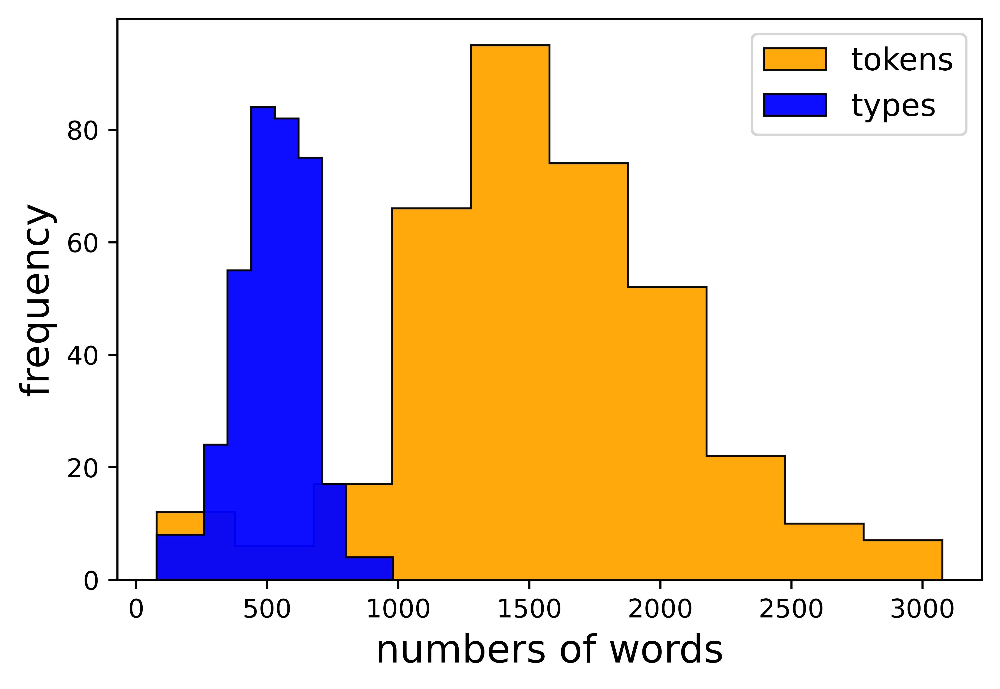

In [36]:
fig, ax = plt.subplots(dpi=800)

H=list(mean_tokens.values())
data = np.array(H)
plt.hist(data, bins='sturges', cumulative=False, linewidth=0.75, color='orange',alpha=0.95,histtype='stepfilled',stacked=True,density=False,
        zorder=5, edgecolor='k',label='tokens')

H=list(mean_types.values())
data = np.array(H)
plt.hist(data, bins='sturges', cumulative=False, linewidth=0.75, color='blue',alpha=0.95,histtype='stepfilled',stacked=True,density=False,
        zorder=5, edgecolor='k',label='types')

plt.legend(loc='best',fontsize=12)
print(np.mean(data))
plt.xlabel(r'numbers of words',fontsize=15)
plt.ylabel(r'frequency',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('words.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

89.51523545706371


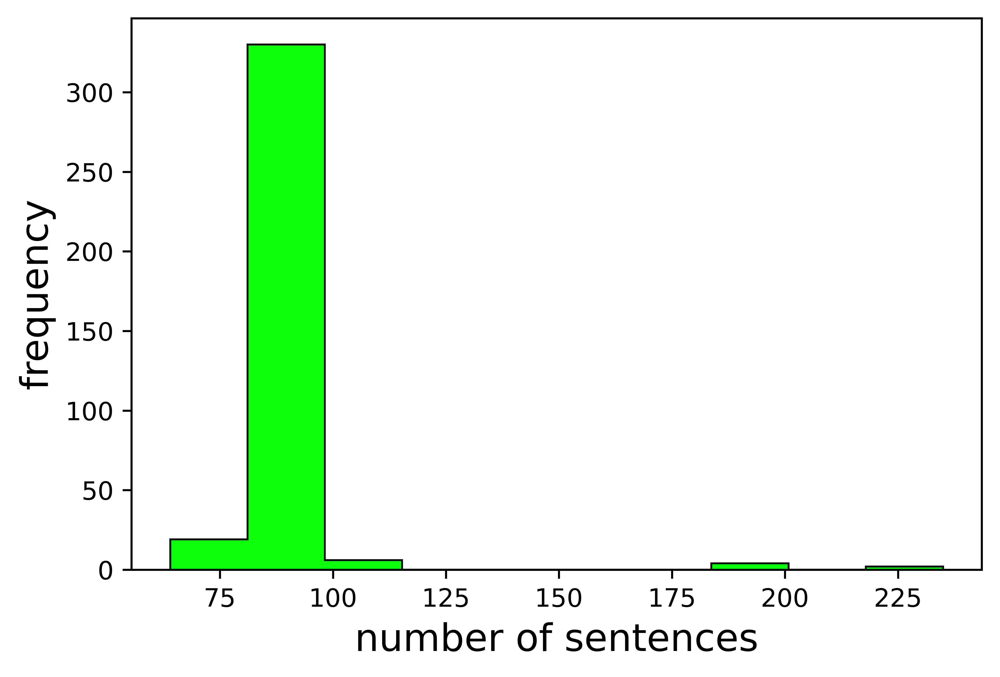

In [37]:
fig, ax = plt.subplots(dpi=800)

H=list(number_sentences.values())
data = np.array(H)
plt.hist(data, bins='sturges', cumulative=False, linewidth=0.75, color='lime',alpha=0.95,histtype='stepfilled',stacked=False,density=False,
        zorder=5, edgecolor='k')
print(np.mean(data))
plt.xlabel(r'number of sentences',fontsize=15)
plt.ylabel(r'frequency',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('sentences.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [38]:
len(clean_languages['ayr'])

87

## graphs!

In [39]:
import networkx as nx

In [40]:
## adjacency graph
## n_sent: graph with n_sent sentences

def GoW(text_clean,radius=2):
    
    G=nx.Graph()
    for sentence in text_clean:
        if len(sentence)>1:
            pairs=[]
            for r in list(range(1,radius+1)):
                pairs+=list(zip(sentence,sentence[r:]))#+list(zip(sentence,sentence[2:]))+list(zip(sentence,sentence[3:]))
            for pair in pairs:
                if G.has_edge(pair[0],pair[1])==False:
                    G.add_edge(pair[0],pair[1],weight=1)
                else:
                    x=G[pair[0]][pair[1]]['weight']
                    G[pair[0]][pair[1]]['weight']=x+1
                    
    Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
    G0 = G.subgraph(Gcc[0])
    
    return G0

In [41]:
graphs={}

for language in words_entropy.keys():
    if mean_tokens[language]>mean_types[language]:
        G=GoW(clean_languages[language])
        graphs[language]=G

In [42]:
len(graphs)

353

In [43]:
## 5% most frequent words

R = {}

for language in words.keys():
    D = dict(words[language][2])
    D = {k: v for k, v in sorted(D.items(), key=lambda item: item[1],reverse=True)}
    n = len(D)
    percentage = int(n*0.05)
    R[language] = list(D.keys())[:percentage]

In [44]:
R['arn']

['ce',
 'mew',
 'ñi',
 'pu',
 'ka',
 'tañi',
 'kom',
 'rume',
 'mvley',
 'cem',
 'zugu',
 'xoy',
 'kiñe',
 'epu',
 'kvme',
 'mapu',
 'tvfaci',
 'ta',
 'pepi']

In [45]:
## restricted graph

def GoW_R(text_clean,radius=2):
    G=nx.Graph()
    for sentence in text_clean:
        sentence = [word for word in sentence if word not in R[language]]
        if len(sentence)>1:
            pairs=[]
            for r in list(range(1,radius+1)):
                pairs+=list(zip(sentence,sentence[r:]))#+list(zip(sentence,sentence[2:]))+list(zip(sentence,sentence[3:]))
            for pair in pairs:
                if G.has_edge(pair[0],pair[1])==False:
                    G.add_edge(pair[0],pair[1],weight=1)
                else:
                    x=G[pair[0]][pair[1]]['weight']
                    G[pair[0]][pair[1]]['weight']=x+1
                    
    Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
    G0 = G.subgraph(Gcc[0])
    
    return G0

In [46]:
graphsR={}
for language in words_entropy.keys():
    if mean_tokens[language]>mean_types[language]:
        G=GoW_R(clean_languages[language])
        graphsR[language]=G

In [47]:
# symmetry https://arxiv.org/pdf/1504.02162.pdf

!pip install network-symmetry

You should consider upgrading via the 'c:\users\jxver\anaconda3\python.exe -m pip install --upgrade pip' command.


In [48]:
import network_symmetry as ns
sym_graphs = {}

for language in graphs.keys():
    G=graphs[language]
    G=nx.relabel.convert_node_labels_to_integers(G)
    vertex_count = len(G)
    edges = np.array(G.edges())
    weights = [x[2]['weight'] for x in list(G.edges(data=True))]
    directed = False
    measurer = ns.Network(vertex_count = vertex_count, 
                      edges = edges, 
                      directed = directed, 
                      weights = weights)
    h_max = 3
    measurer.set_parameters(h_max= h_max)
    measurer.compute_symmetry()
    sym_graphs[language]=[np.mean(measurer.symmetry_backbone(2)),np.mean(measurer.symmetry_backbone(3)),np.mean(measurer.symmetry_merged(2)),np.mean(measurer.symmetry_merged(3))]

In [49]:
sym_graphsR = {}

for language in graphsR.keys():
    G=graphsR[language]
    G=nx.relabel.convert_node_labels_to_integers(G)
    vertex_count = len(G)
    edges = np.array(G.edges())
    weights = [x[2]['weight'] for x in list(G.edges(data=True))]
    directed = False
    measurer = ns.Network(vertex_count = vertex_count, 
                      edges = edges, 
                      directed = directed, 
                      weights = weights)
    h_max = 3
    measurer.set_parameters(h_max= h_max)
    measurer.compute_symmetry()
    sym_graphsR[language]=[np.mean(measurer.symmetry_backbone(2)),np.mean(measurer.symmetry_backbone(3)),np.mean(measurer.symmetry_merged(2)),np.mean(measurer.symmetry_merged(3))]

In [50]:
len(sym_graphs['arn'])

4

## PCA

In [51]:
m0 = max(list(zip(*list(sym_graphs.values())))[0])
m1 = max(list(zip(*list(sym_graphs.values())))[1])
m2 = max(list(zip(*list(sym_graphs.values())))[2])
m3 = max(list(zip(*list(sym_graphs.values())))[3])

In [52]:
sym_graphs = {key:[sym_graphs[key][0]/m0,sym_graphs[key][1]/m1,sym_graphs[key][2]/m2,sym_graphs[key][3]/m3] for key in sym_graphs.keys()}

In [53]:
m0R = max(list(zip(*list(sym_graphsR.values())))[0])
m1R = max(list(zip(*list(sym_graphsR.values())))[1])
m2R = max(list(zip(*list(sym_graphsR.values())))[2])
m3R = max(list(zip(*list(sym_graphsR.values())))[3])

In [54]:
sym_graphsR = {key:[sym_graphsR[key][0]/m0R,sym_graphsR[key][1]/m1R,sym_graphsR[key][2]/m2R,sym_graphsR[key][3]/m3R] for key in sym_graphsR.keys()}

In [55]:
X_sym=[]
for lengua in sym_graphs.keys():
    X_sym+=[sym_graphs[lengua]]

In [56]:
from sklearn.manifold import TSNE

In [57]:
X_sym = TSNE(n_components=2,perplexity=25,init='pca',random_state=0).fit_transform(X_sym)

In [58]:
#XR = TSNE(n_components=2,perplexity=10,init='pca',random_state=0).fit_transform(XR)

In [59]:
x=list(zip(*list(X_sym)))[0]
y=list(zip(*list(X_sym)))[1]

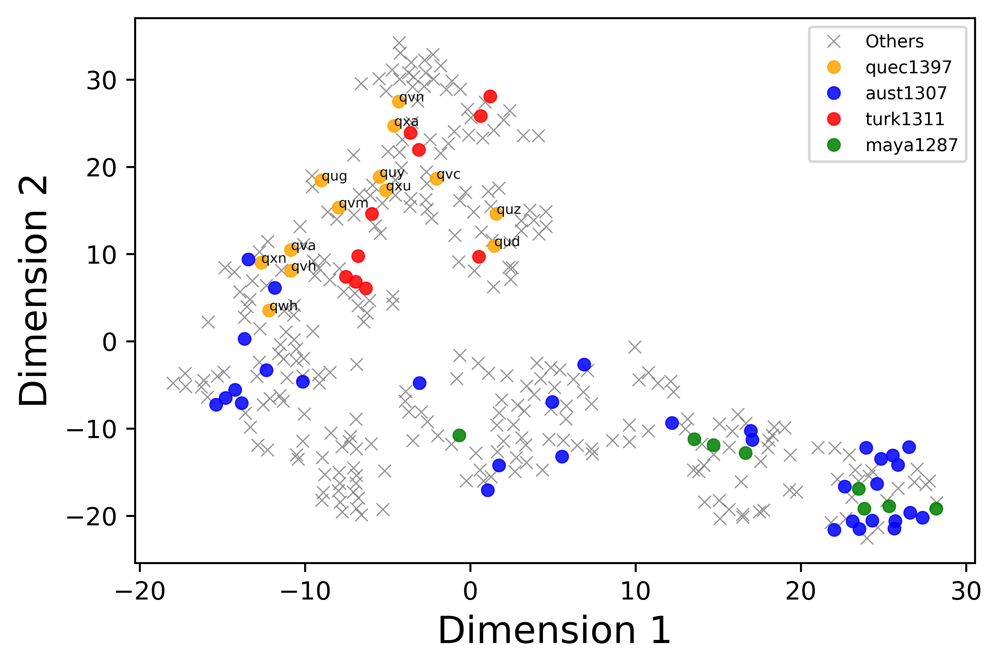

In [60]:
fig, ax = plt.subplots(dpi=800)

for lengua in sym_graphs.keys():
    i = list(sym_graphs.keys()).index(lengua)
    if fam_dict[lengua]=='quec1387':
        ax.annotate(lengua, color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=5.5, alpha=0.95)

#ax.plot([xR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],[yR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],marker='o',color='k',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='none',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.ylabel(r'Dimension 2',fontsize=15)
plt.xlabel(r'Dimension 1',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('TSNE_sym.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

### spectra!

In [65]:
from numpy import linalg as LA

def spectrum(G):
    M=nx.normalized_laplacian_matrix(G).todense()
    eigs=LA.eigvals(M)
    return eigs

In [62]:
spectrum_languages={}

for language in graphs.keys():
    #print(language)
    G=graphsR[language]
    spectrum_languages[language]=sorted([np.real(n) for n in spectrum(G)])

In [66]:
import statsmodels.api as sm

spectrum_norm = {}
one = {}
oneR = {}

for language in graphs.keys():
    G = graphs[language]
    GR = graphsR[language]
    
    spectrumO = sorted([np.real(n) for n in spectrum(G)])
    kde = sm.nonparametric.KDEUnivariate(spectrumO)
    kde.fit(bw=0.065) # Estimate the densities
    one[language]=kde.evaluate(1)
    
    spectrumR = sorted([np.real(n) for n in spectrum(GR)])
    kde = sm.nonparametric.KDEUnivariate(spectrumR)
    kde.fit(bw=0.065) # Estimate the densities
    oneR[language]=kde.evaluate(1)

In [84]:
x=list(one.values())
y=[one[language]/oneR[language] for language in one.keys()]

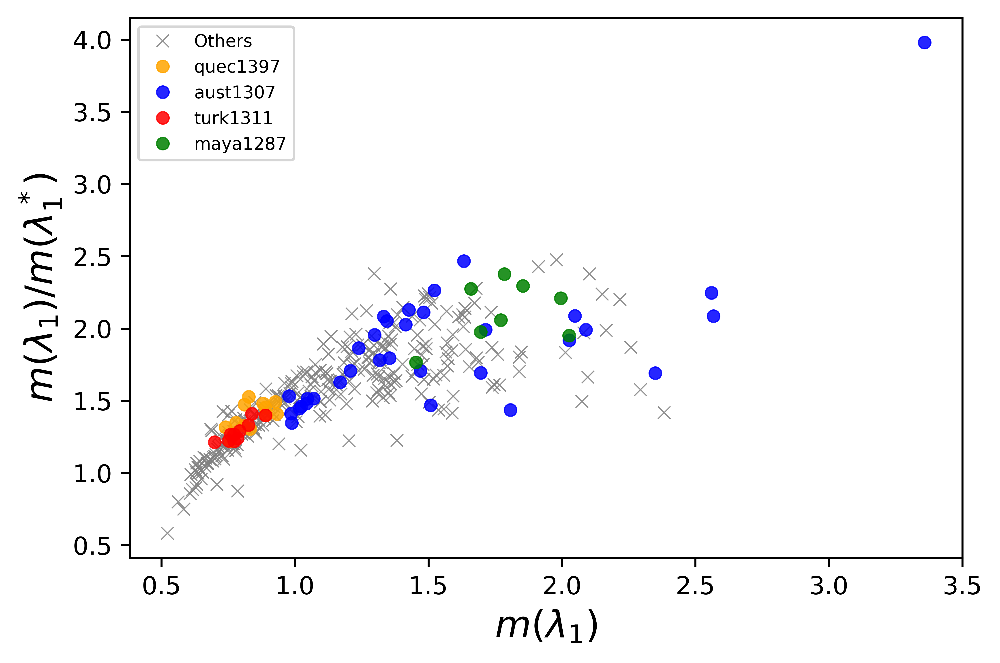

In [85]:
fig, ax = plt.subplots(dpi=800)

#for lengua in one.keys():
#    i = list(one.keys()).index(lengua)
#    if fam_dict[lengua]=='quec1387':
#        ax.annotate(lengua, color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=5.5, alpha=0.95)

#ax.plot([xR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],[yR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],marker='o',color='k',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='none',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(one.keys()).index(language) for language in one.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.ylabel(r'$m(\lambda_1)/m(\lambda^*_1)$',fontsize=15)
plt.xlabel(r'$m(\lambda_1)$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('one.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [86]:
colors = {'quec1387':'orange','aust1307':'blue','turk1311':'r','maya1287':'green'}

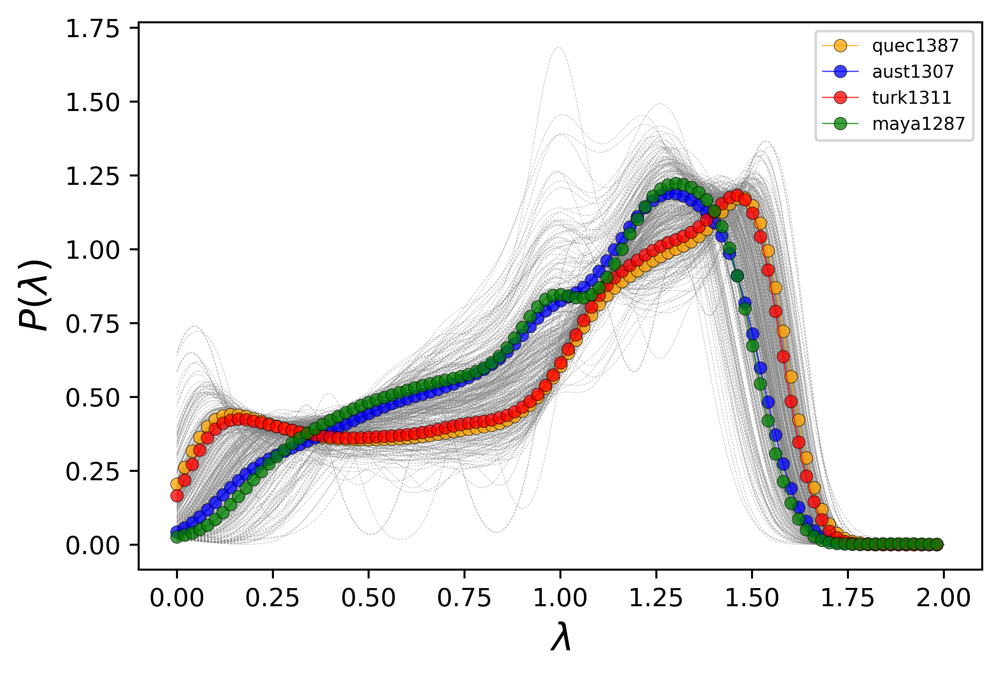

In [87]:
import statsmodels.api as sm

L={}

Q = []
A = []
T = []
M = []
O = []

fig, ax = plt.subplots(dpi=800)

import matplotlib.colors
#cmap = plt.cm.viridis
#norm = matplotlib.colors.Normalize(vmin=min(entropy_languages.values()), vmax=max(entropy_languages.values()))

for language in spectrum_languages.keys():
    data = np.array(spectrum_languages[language])
    #plt.hist(data, bins='doane', cumulative=False, alpha=0.1,histtype='step',stacked=False,density=True,
    #    zorder=5, edgecolor='k')
    kde = sm.nonparametric.KDEUnivariate(data)
    kde.fit(bw=0.065) # Estimate the densities
    X=np.linspace(0, 2, num=1000)
    prediction=[kde.evaluate(x) for x in X]
    L[language]=prediction
    
    if fam_dict[language]=='quec1387':
        Q+=[prediction]
    elif fam_dict[language]=='aust1307':
        A+=[prediction]
    elif fam_dict[language]=='turk1311':
        T+=[prediction]
    elif fam_dict[language]=='maya1287':
        M+=[prediction]
    else:
        O+=[prediction]
    
    ax.plot(X, prediction, '--', lw=0.25, color='gray', alpha=0.5, zorder=10)

Q=[np.mean(x) for x in list(zip(*Q))]
A=[np.mean(x) for x in list(zip(*A))]
T=[np.mean(x) for x in list(zip(*T))]
M=[np.mean(x) for x in list(zip(*M))]
#NA=[np.mean(x) for x in list(zip(*NA))]

plt.plot(X, Q, markevery=10,marker='o',markersize=5,markeredgecolor='k',markeredgewidth=0.25,fillstyle='full', lw=0.5, alpha=0.75, color='orange', zorder=10, label='quec1387')
plt.plot(X, A, markevery=10,marker='o',markersize=5,markeredgecolor='k',markeredgewidth=0.25,fillstyle='full', lw=0.5, alpha=0.75, color='blue', zorder=10, label='aust1307')
plt.plot(X, T, markevery=10,marker='o',markersize=5,markeredgecolor='k',markeredgewidth=0.25,fillstyle='full', lw=0.5, alpha=0.75, color='r', zorder=10, label='turk1311')
plt.plot(X, M, markevery=10,marker='o',markersize=5,markeredgecolor='k',markeredgewidth=0.25,fillstyle='full', lw=0.5, alpha=0.75, color='green', zorder=10, label='maya1287')

#plt.plot(X, NA, markevery=10,marker='*',markersize=5,markeredgecolor='k',markeredgewidth=0.25,fillstyle='full', lw=0.5, alpha=0.75, color='m', zorder=10, label='North America')

#sma = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#sma.set_array([])  # only needed for matplotlib < 3.1
#fig.colorbar(sma)
#cbar.set_label(r'$H$', rotation=270)

#cbar = fig.colorbar(sma)
#cbar.ax.set_ylabel(r'entropy $H$',fontsize=15)

plt.legend(loc='best',fontsize=7)
#plt.xlim([-10,10])
#plt.ylim([0., 3])
plt.xlabel(r'$\lambda$',fontsize=15)
plt.ylabel(r'$P(\lambda)$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('spectrumR.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [88]:
X = []

for lengua in L.keys():
    X+=[[item[0] for item in L[lengua]]]

In [89]:
X = TSNE(n_components=2,perplexity=50,init='pca',random_state=0).fit_transform(X)

In [90]:
x=list(zip(*list(X)))[0]
y=list(zip(*list(X)))[1]

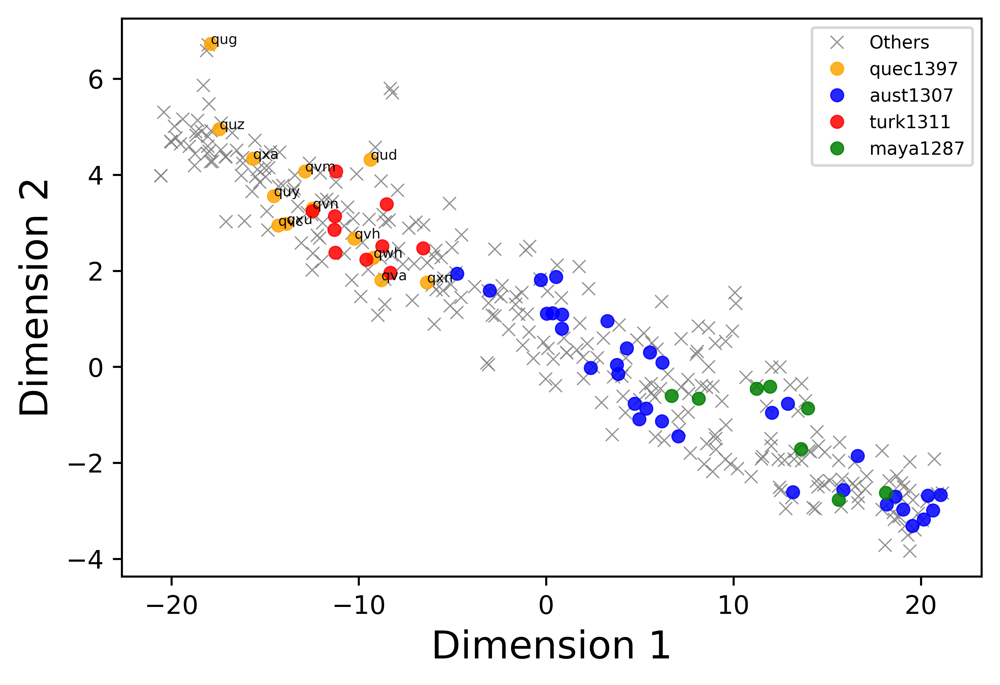

In [91]:
fig, ax = plt.subplots(dpi=800)

for lengua in L.keys():
    i = list(L.keys()).index(lengua)
    if fam_dict[lengua]=='quec1387':
        ax.annotate(lengua, color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=5.5, alpha=0.95)

#ax.plot([xR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],[yR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],marker='o',color='k',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='none',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(L.keys()).index(language) for language in L.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.ylabel(r'Dimension 2',fontsize=15)
plt.xlabel(r'Dimension 1',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('TSNE_spectral.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

### energies!

In [92]:
energies_normalized_laplacian = {}

for language in graphs.keys():
    G=graphs[language]
    energies_normalized_laplacian[language]=sum([np.abs(eig-1) for eig in nx.normalized_laplacian_spectrum(G, weight='weight')])/len(G)

In [93]:
X_sym=[]
y = []
for lengua in sym_graphs.keys():
    X_sym+=[sym_graphs[lengua]]
    y+=[energies_normalized_laplacian[lengua]]

In [94]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_sym, y, test_size=0.25, random_state=0)

In [95]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=100, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [96]:
# Use the forest's predict method on the test data
predictions = regressor.predict(X_test)# Calculate the absolute errors
errors = abs(predictions - y_test)# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2))

Mean Absolute Error: 0.02


In [97]:
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 92.04 %.


In [98]:
E_pred = regressor.predict(X_sym)

In [99]:
len(E_pred)

353

In [100]:
from scipy.stats import spearmanr
corr, _ = spearmanr(np.array(y), np.array(E_pred))
print('Spearmans correlation: %.3f' % corr)

Spearmans correlation: 0.953


In [101]:
x=y
y=E_pred

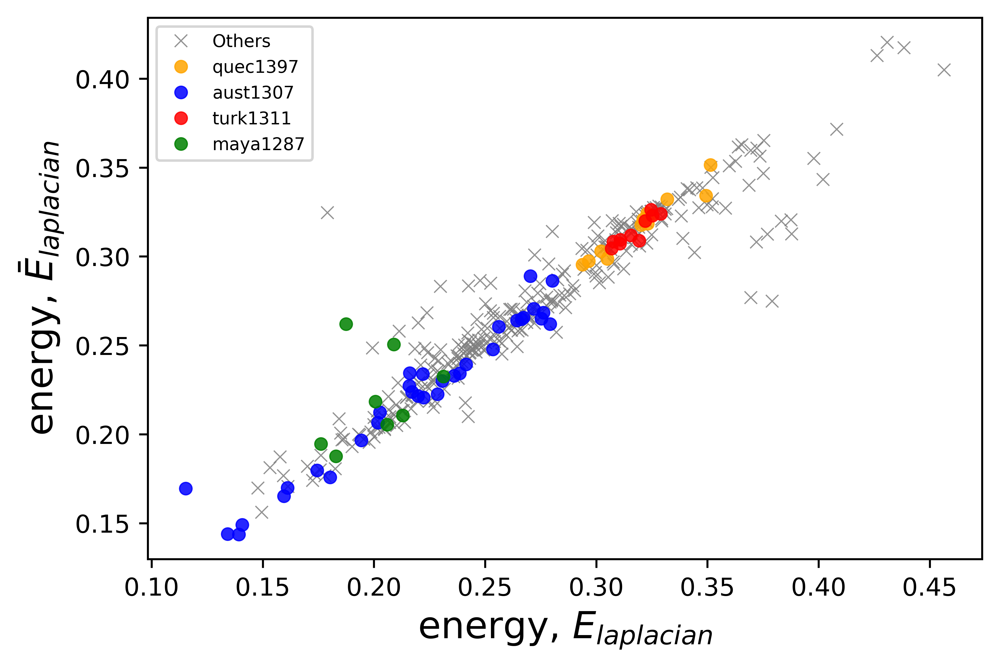

In [102]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=800)
#for lengua in energies_normalized_laplacian.keys():
#    i = list(energies_normalized_laplacian.keys()).index(lengua)
#    if fam_dict[lengua] in ['aust1307','quec1387']:
#        ax.annotate(fam_dict[lengua], color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=4.5, alpha=0.95)

#ax.plot([energies_normalized_laplacian[L] for L in energies_normalized_laplacian.keys()],[sym_graphs[L][0] for L in energies_normalized_laplacian.keys()],marker='o',color='orange',markersize=5,markeredgewidth=0.75,markeredgecolor=None,alpha=0.95,linewidth=0.,fillstyle='full',clip_on=True)

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

#plt.ticklabel_format(axis='x', style='sci',scilimits=(0,5))
plt.legend(loc='best',fontsize=7)
#plt.title(r'$\wp=$'+str(p),fontsize=15)
plt.ylabel(r'energy, $\bar{E}_{laplacian}$',fontsize=15)
plt.xlabel(r'energy, $E_{laplacian}$',fontsize=15)
plt.rcParams.update({'font.size': 12})
#plt.axis([0,1,0.45,1])
plt.savefig('energy_pred.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [103]:
sym_quec ={L:sym_graphs[L][0] for L in sym_graphs.keys() if fam_dict[L] =='quec1387'}

In [104]:
len(sym_quec)

13

In [105]:
{k: v for k, v in sorted(sym_quec.items(), key=lambda item: item[1])}

{'qvh': 0.4941671456855368,
 'qxn': 0.5168669247501364,
 'qvn': 0.5294381520428465,
 'qwh': 0.5631039005604055,
 'qxa': 0.5656146903775281,
 'qva': 0.573411709822002,
 'qvm': 0.5840748884227378,
 'quy': 0.6024715011207615,
 'qxu': 0.6148568480935281,
 'qvc': 0.6288961454311598,
 'qug': 0.6662531131561056,
 'qud': 0.6701331706160482,
 'quz': 0.6875014433841761}

In [74]:
x=[energies_normalized_laplacian[L] for L in energies_normalized_laplacian.keys()]
y=[sym_graphs[L][0] for L in energies_normalized_laplacian.keys()]

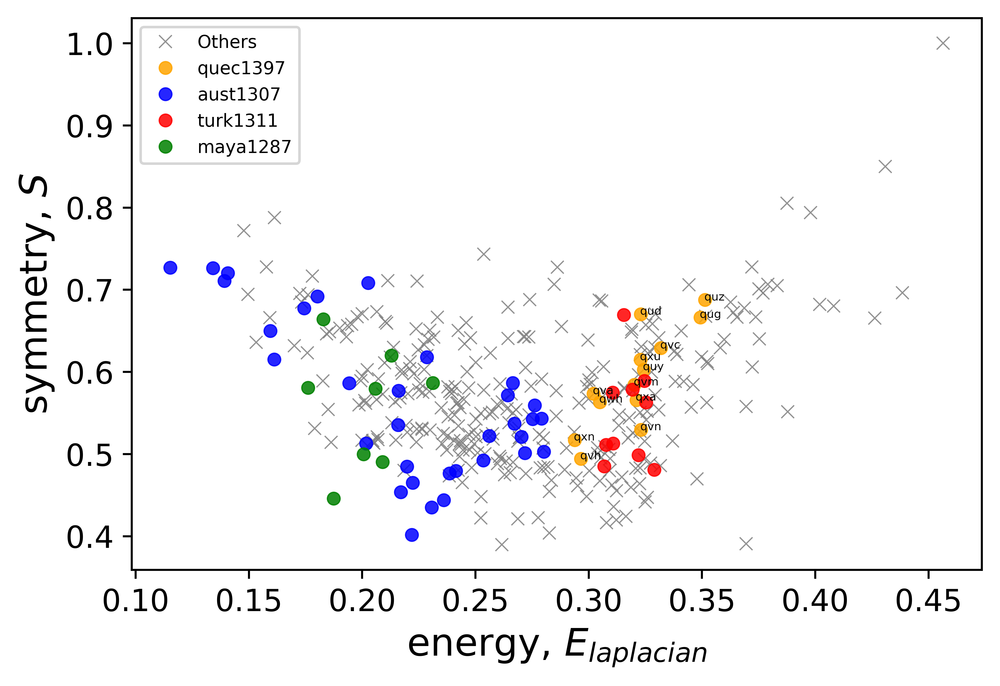

In [75]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=800)
for lengua in energies_normalized_laplacian.keys():
    i = list(energies_normalized_laplacian.keys()).index(lengua)
    if fam_dict[lengua] in ['quec1387']:
        ax.annotate(lengua, color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=4.5, alpha=0.95)

#ax.plot([energies_normalized_laplacian[L] for L in energies_normalized_laplacian.keys()],[sym_graphs[L][0] for L in energies_normalized_laplacian.keys()],marker='o',color='orange',markersize=5,markeredgewidth=0.75,markeredgecolor=None,alpha=0.95,linewidth=0.,fillstyle='full',clip_on=True)

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

#plt.ticklabel_format(axis='x', style='sci',scilimits=(0,5))
plt.legend(loc='best',fontsize=7)
#plt.title(r'$\wp=$'+str(p),fontsize=15)
plt.ylabel(r'symmetry, $S$',fontsize=15)
plt.xlabel(r'energy, $E_{laplacian}$',fontsize=15)
plt.rcParams.update({'font.size': 12})
#plt.axis([0,1,0.45,1])
plt.savefig('normalized_laplacian_energy.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

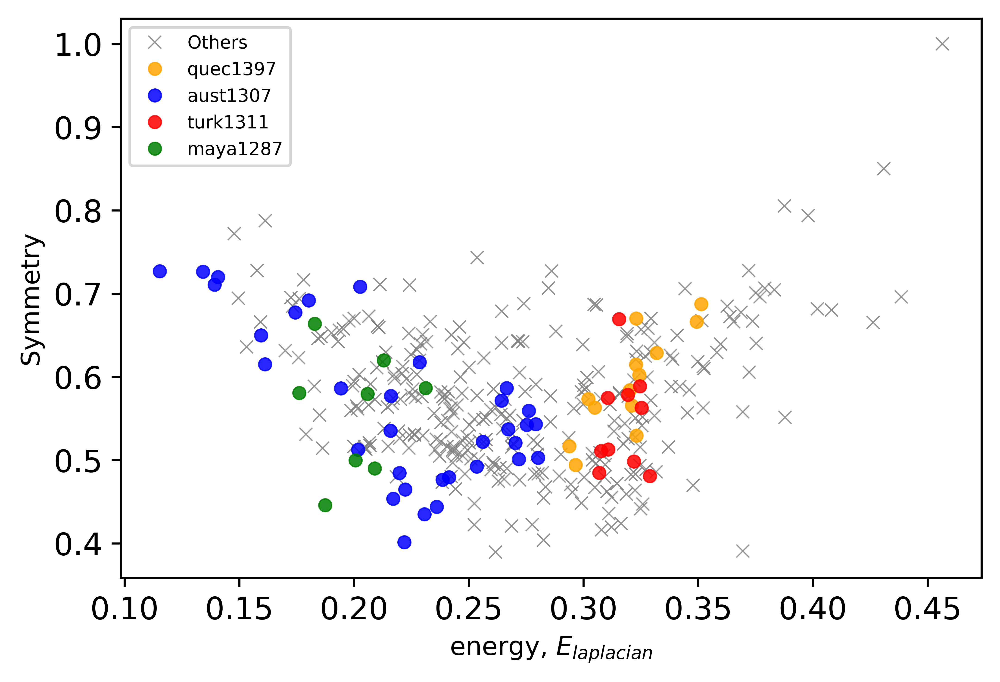

In [76]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=800)
#for lengua in energies_normalized_laplacian.keys():
#    i = list(energies_normalized_laplacian.keys()).index(lengua)
#    if fam_dict[lengua] in ['aust1307','quec1387']:
#        ax.annotate(fam_dict[lengua], color='k', xy=(x[i]-0.0004,y[i]-0.0004), fontsize=4.5, alpha=0.95)

#ax.plot([energies_normalized_laplacian[L] for L in energies_normalized_laplacian.keys()],[sym_graphs[L][0] for L in energies_normalized_laplacian.keys()],marker='o',color='orange',markersize=5,markeredgewidth=0.75,markeredgecolor=None,alpha=0.95,linewidth=0.,fillstyle='full',clip_on=True)

y=[sym_graphs[node][0] for node in energies_normalized_laplacian.keys()]
x=[energies_normalized_laplacian[node] for node in energies_normalized_laplacian.keys()]

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.xlabel(r'energy, $E_{laplacian}$',fontsize=10)
plt.ylabel(r'Symmetry',fontsize=10)
plt.rcParams.update({'font.size': 10})
plt.savefig('sym_laplacian.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [77]:
import scipy

scipy.stats.pearsonr([sym_graphs[node][0] for node in energies_normalized_laplacian.keys()],[energies_normalized_laplacian[node] for node in energies_normalized_laplacian.keys()])

(0.029985193901836474, 0.5744576002349979)

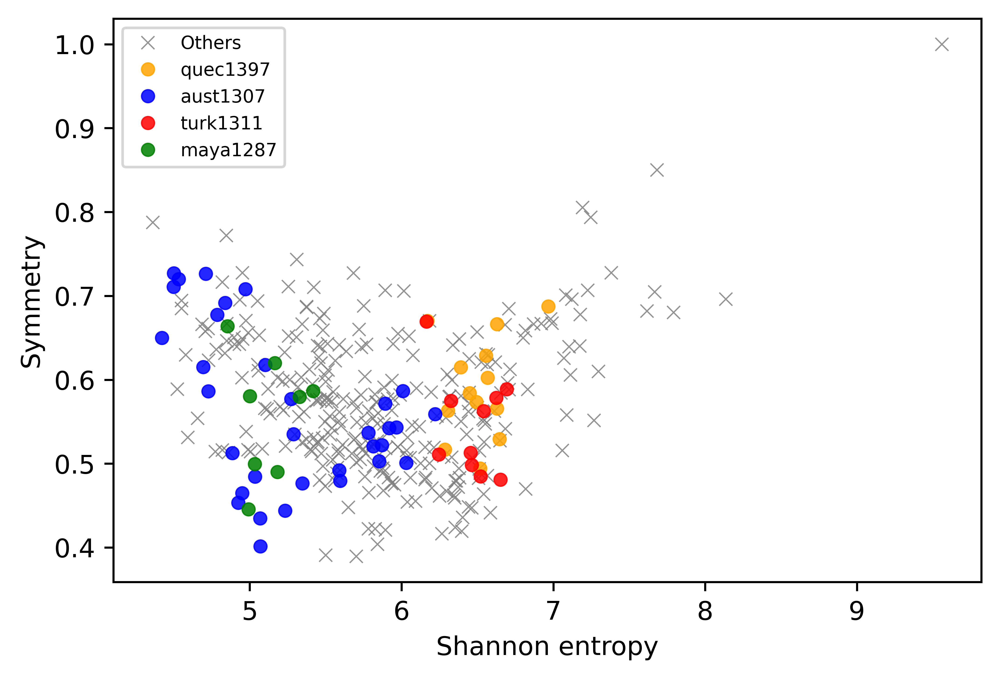

In [78]:
fig, ax = plt.subplots(dpi=800)

x=[words_entropy[node] for node in energies_normalized_laplacian.keys()]
y=[sym_graphs[node][0] for node in energies_normalized_laplacian.keys()]

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.ylabel(r'Symmetry',fontsize=10)
plt.xlabel(r'Shannon entropy',fontsize=10)
plt.rcParams.update({'font.size': 10})
plt.savefig('entropy_sym.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [79]:
import scipy

scipy.stats.pearsonr([words_entropy[node] for node in energies_normalized_laplacian.keys()],[sym_graphs[node][0] for node in energies_normalized_laplacian.keys()])

(0.04845629524234718, 0.36402862977125383)

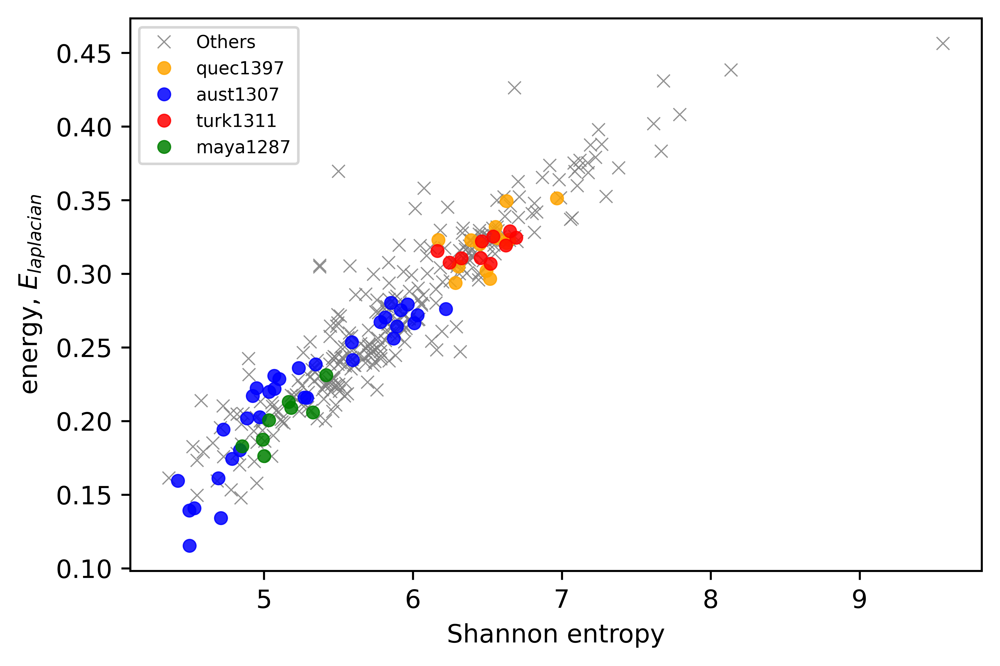

In [80]:
fig, ax = plt.subplots(dpi=800)

x=[words_entropy[node] for node in energies_normalized_laplacian.keys()]
y=[energies_normalized_laplacian[node] for node in energies_normalized_laplacian.keys()]

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] not in ['quec1387','aust1307','turk1311','maya1287']]],marker='x',color='gray',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='Others')

ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['quec1387']]],marker='o',color='orange',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='quec1397')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
ax.plot([x[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(energies_normalized_laplacian.keys()).index(language) for language in energies_normalized_laplacian.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
plt.legend(loc='best',fontsize=7)
plt.ylabel(r'energy, $E_{laplacian}$',fontsize=10)
plt.xlabel(r'Shannon entropy',fontsize=10)
plt.rcParams.update({'font.size': 10})
plt.savefig('entropy_laplacian.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [81]:
scipy.stats.pearsonr([words_entropy[node] for node in energies_normalized_laplacian.keys()],[energies_normalized_laplacian[node] for node in energies_normalized_laplacian.keys()])

(0.9351034866963945, 3.3065621113286194e-160)

### spanish

In [82]:
import pickle
import networkx as nx
import numpy as np

In [83]:
grafo_non = pickle.load(open("grafo_non.p", "rb"))

In [84]:
len(grafo_non)

946

In [85]:
energies_spa = {}
Ei = sum([np.abs(eig-1) for eig in nx.normalized_laplacian_spectrum(grafo_non, weight=None)])/len(grafo_non)
eigen = dict(nx.eigenvector_centrality(grafo_non))
for node in grafo_non.nodes():
    Gc = grafo_non.copy()
    Gc.remove_node(node)
    energies_spa[node]=np.abs(sum([np.abs(eig-1) for eig in nx.normalized_laplacian_spectrum(Gc, weight=None)])/len(Gc)-Ei)/Ei

In [86]:
C = list({k: v for k, v in sorted(energies_spa.items(), key=lambda item: item[1],reverse=True)}.keys())[:30]

In [87]:
C

['de',
 'que',
 'y',
 'la',
 'en',
 'el',
 'los',
 'se',
 'a',
 'mas',
 'con',
 'las',
 'para',
 'no',
 'lo',
 'un',
 'una',
 'muy',
 'del',
 'por',
 'clases',
 'o',
 'como',
 'me',
 'son',
 'profesor',
 'tener',
 'estructura',
 'clase',
 'al']

In [88]:
G=grafo_non.copy()
Gc=nx.relabel.convert_node_labels_to_integers(G)
vertex_count = len(Gc)
edges = np.array(Gc.edges())
weights = [x[2]['weight'] for x in list(Gc.edges(data=True))]
directed = False
measurer = ns.Network(vertex_count = vertex_count, 
                      edges = edges, 
                      directed = directed, 
                      weights = weights)
h_max = 3
measurer.set_parameters(h_max= h_max)
measurer.compute_symmetry()
sym_grafo=[measurer.symmetry_backbone(2),measurer.symmetry_backbone(3),measurer.symmetry_merged(2),measurer.symmetry_merged(3)]

In [89]:
dict_sym = dict(zip(G.nodes(),sym_grafo))

In [90]:
dict_sym

{'el': [0.26337501406669617,
  0.27734681963920593,
  0.35785868763923645,
  0.3581200838088989,
  0.20931483805179596,
  0.3406277000904083,
  0.7722853422164917,
  0.25911203026771545,
  0.27261829376220703,
  0.3905160427093506,
  0.3208331763744354,
  0.5053671598434448,
  0.3956253230571747,
  0.3034871220588684,
  0.27376067638397217,
  0.38047945499420166,
  0.6296465396881104,
  0.2716524004936218,
  0.3337615132331848,
  0.48594141006469727,
  0.30147331953048706,
  0.40438979864120483,
  0.4063500761985779,
  0.6038530468940735,
  0.31673648953437805,
  0.26642659306526184,
  0.36621201038360596,
  0.36166030168533325,
  0.293987900018692,
  0.32366645336151123,
  0.36967048048973083,
  0.29388880729675293,
  0.2811903655529022,
  0.2468009740114212,
  0.22108601033687592,
  0.31970885396003723,
  0.3791573643684387,
  0.23799940943717957,
  0.2692084312438965,
  0.4281230866909027,
  0.3800976574420929,
  0.42840510606765747,
  0.6186774373054504,
  0.3503401577472687,
  0.3

In [91]:
X_sym=[]
y = []
for i in range(len(G.nodes())):
    X_sym+=[[sym_grafo[0][i],sym_grafo[1][i],sym_grafo[2][i],sym_grafo[3][i]]]
    y+=[energies_spa[list(G.nodes())[i]]]

In [92]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sym, y, test_size=0.25, random_state=0)

In [93]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators=100, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [94]:
# Use the forest's predict method on the test data
predictions = regressor.predict(X_test)# Calculate the absolute errors
errors = abs(predictions - y_test)# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 4))

Mean Absolute Error: 0.0009


In [95]:
y_test[:10],y_pred[:10]

([0.0009444712093068567,
  0.0006112397013059117,
  0.00045798088246239144,
  0.0001739259806581941,
  0.0008100339731856351,
  0.0009872901004059022,
  0.0021456012245933955,
  0.00033247487883358937,
  4.802527628709416e-05,
  0.005129048966172704],
 array([0.00114168, 0.00100908, 0.00045568, 0.00047675, 0.00074417,
        0.0009331 , 0.00065361, 0.00069918, 0.00046265, 0.014226  ]))

In [96]:
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: -130.19 %.


In [97]:
E_pred = regressor.predict(X_sym)

In [98]:
from scipy.stats import spearmanr
corr, _ = spearmanr(np.array(y), np.array(E_pred))
print('Spearmans correlation: %.3f' % corr)

Spearmans correlation: 0.783


In [99]:
X_sym = TSNE(n_components=2,perplexity=25,init='pca',random_state=0).fit_transform(X_sym)

In [100]:
x=list(zip(*list(X_sym)))[0]
y=list(zip(*list(X_sym)))[1]

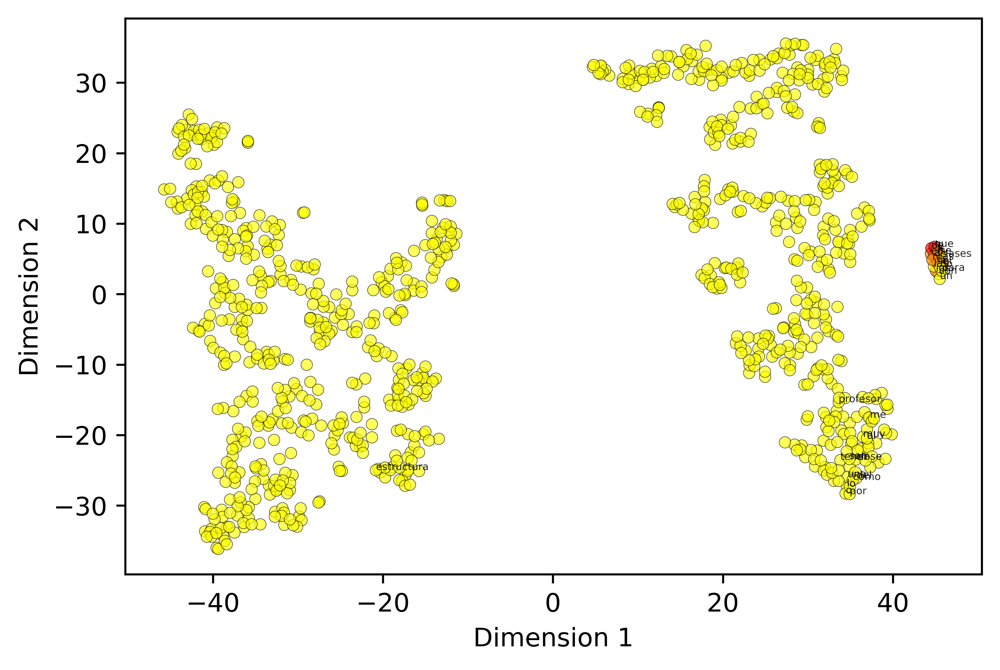

In [101]:
fig, ax = plt.subplots(dpi=800)

for node in G.nodes():
    if node in C:
        ax.annotate(node, color='k', xy=(x[list(G.nodes()).index(node)]-0.0004,y[list(G.nodes()).index(node)]-0.0004), fontsize=4, alpha=0.85)


#ax.plot([xR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],[yR[i] for i in [list(sample_accR.keys()).index(language) for language in sample_accR.keys()]],marker='o',color='k',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='none',clip_on=True,label='Others')

#ax.plot(x,y,marker='o',color=list(energies_spa.values()),cmap=plt.cm.get_cmap('autumn',3),linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True)
plt.scatter(x,y, c=list(energies_spa.values()), s=20, edgecolors='k',linewidths=0.25, cmap=plt.cm.get_cmap('autumn',3).reversed(),alpha=0.65)

#ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['aust1307']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['aust1307']]],marker='o',color='blue',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='aust1307')
#ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['turk1311']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['turk1311']]],marker='o',color='r',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='turk1311')
#ax.plot([x[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['maya1287']]],[y[i] for i in [list(sym_graphs.keys()).index(language) for language in sym_graphs.keys() if fam_dict[language] in ['maya1287']]],marker='o',color='green',linewidth=0,markersize=5,markeredgewidth=0.5,markeredgecolor=None,alpha=0.85,fillstyle='full',clip_on=True,label='maya1287')

plt.grid(False)
#plt.title(str(len(languages))+' languages with '+str(len(keys_comunes))+' features',fontsize=10)
#ax.set_yticks([])
#ax.set_xticks([])
#plt.legend(loc='best',fontsize=7)
plt.ylabel(r'Dimension 2',fontsize=10)
plt.xlabel(r'Dimension 1',fontsize=10)
plt.rcParams.update({'font.size': 10})
plt.savefig('TSNE_sym_spa.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()